### Import libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import PIL
import pickle
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import confusion_matrix, classification_report

### Parameters

In [2]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 30

### Extract data from data.rar (loaded from drive)

In [3]:
!unrar x -o+ /content/drive/MyDrive/data.rar /content/data/

Streaming output truncated to the last 5000 lines.
Extracting  /content/data/resnet/illegal_parking/VID20221110141940_mp4-32_jpg.rf.1eaba72d935e1ab35b515818a5a99e4e.jpg      76%  OK 
Extracting  /content/data/resnet/illegal_parking/VID20221110141940_mp4-36_jpg.rf.d6fbd784257b0fa0ef96022dd6e611e4.jpg      76%  OK 
Extracting  /content/data/resnet/illegal_parking/VID20221111140251_rotated_mp4-7_jpg.rf.c2cc91b7a710414b26275168484dc80a.jpg      76%  OK 
Extracting  /content/data/resnet/illegal_parking/VID20221111140251_rotated_mp4-8_jpg.rf.b03f9bdd24910f8c1074d395e642bfdf.jpg      76%  OK 
Extracting  /content/data/resnet/illegal_parking/VID20221111142950_mp4-6_jpg.rf.147ea2be0192aa00cb9f6096f8687f02.jpg      77%  OK 
Extracting  /content/data/resnet/illegal_parking/VID20221111142950_mp4-6_jpg.rf.4847af77ea5e5d1a0b767fb1a6e514dc.jpg      77%  OK 
Extracting  /content/data/resnet/illegal_parking/VID20221114123126_mp4-16_jpg.rf.56ad74f9a6

### Load the data and split 80% of it for training and 20% for validation

In [96]:
train_ds = tf.keras.utils.image_dataset_from_directory(
 "/content/data/data",
 validation_split=0.2,
 subset="training",
 seed=123,
 image_size=IMG_SIZE,
 batch_size=BATCH_SIZE,
 color_mode='rgb',
 label_mode='categorical' #used for multi-class
)

val_ds = tf.keras.utils.image_dataset_from_directory(
 "/content/data/data",
 validation_split=0.2,
 subset="validation",
 seed=123,
 image_size=IMG_SIZE,
 batch_size=BATCH_SIZE,
 color_mode='rgb',
 label_mode='categorical'
)

Found 12768 files belonging to 9 classes.
Using 10215 files for training.
Found 12768 files belonging to 9 classes.
Using 2553 files for validation.


### See the class names

In [87]:
class_names = val_ds.class_names
print(class_names)

['animals', 'cracks_or_peeling_paint', 'defect_pole', 'floods', 'garbage', 'illegal_parking', 'power_bird', 'road_shield', 'vandalisme_graffiti']


### Plot one image from each class to see them

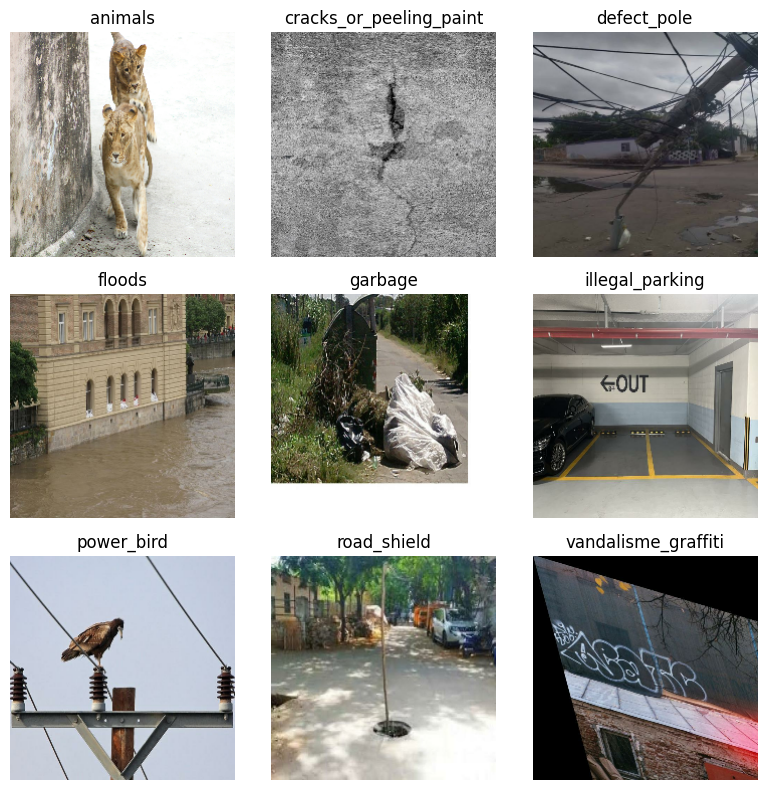

In [88]:
def plot_one_image_per_class(dataset, class_names):
    seen_classes = set()
    images_by_class = {}

    for images, labels in dataset: #take one image per class
        for img, label in zip(images, labels):
            class_idx = int(tf.argmax(label)) if tf.rank(label) > 0 else int(label)
            if class_idx not in seen_classes:
                images_by_class[class_idx] = img.numpy().astype("uint8")
                seen_classes.add(class_idx)
            if len(seen_classes) == len(class_names):
                break
        if len(seen_classes) == len(class_names):
            break

    plt.figure(figsize=(8, 8))
    for i, class_idx in enumerate(sorted(images_by_class)):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images_by_class[class_idx])
        plt.title(class_names[class_idx])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

plot_one_image_per_class(train_ds, class_names)

### Data augmentation

In [99]:
data_augmentation = tf.keras.Sequential([
 layers.RandomFlip("horizontal_and_vertical"), #mirror te images both vertical and horizontal
 layers.RandomZoom(0.3), #random zoom of images
 layers.RandomContrast(0.3), #adjust contrast (increase range a little bit)
 layers.RandomTranslation(0.2, 0.2), #translation 0.1
 layers.RandomBrightness(factor=0.4), #varies brightness +/- 20%
 layers.Lambda(lambda x: tf.image.rot90(x, k=2)) #180 degree rotation
])

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)

val_ds = val_ds.prefetch(buffer_size=AUTOTUNE) #no augmentation on validation set

### Plot some augmented images

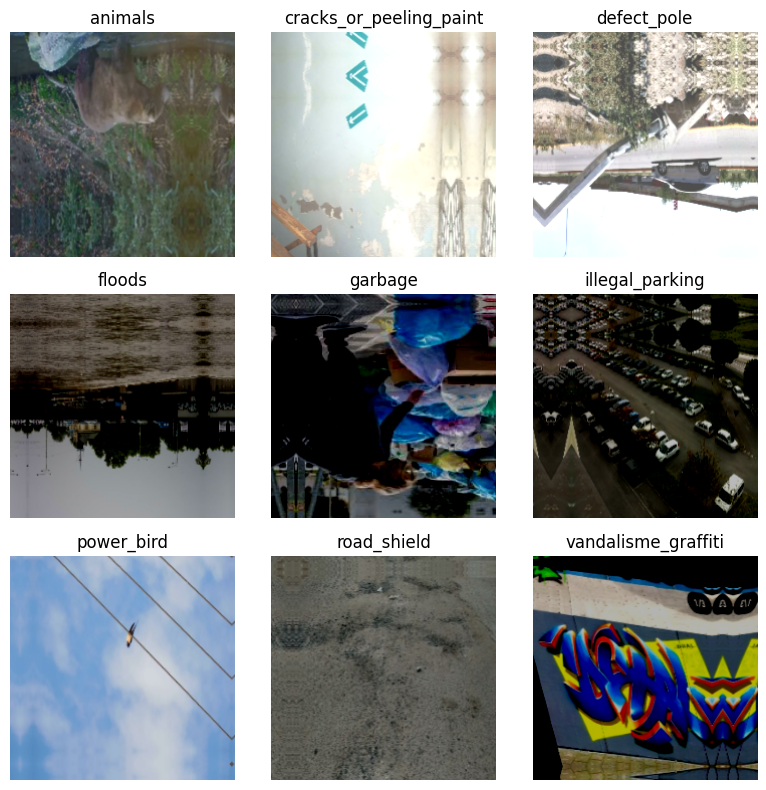

In [100]:
plot_one_image_per_class(train_ds, class_names)

### Model definition

The model is a fine-tuned ResNet50 model for a 9-class classification problem We are using the pre-trained model to reuse learned features, and then customize the top layers to fit our dataset.

In [11]:
resnet_model = Sequential() #defining a Sequential empty model firstly

pretrained_model = tf.keras.applications.ResNet50(include_top=False, #using Transfer Learning of model ResNet50
  input_shape=(224, 224, 3), #image shape definition: image size of 224x224 and the 3 channels (RGB)
  pooling='avg', #after the convolution block -> global average pooling to reduce dimension (flatten the future map into a vector)
  classes=9, #i have 9 classes
  weights='imagenet') #loading the pretrained weights from ImageNet

for layer in pretrained_model.layers[-50:]: #setting the last 50 layers of ResNet to be trainable (top layers remains frozen and the last 50 layers will be fine-tuned for my own dataset)
  layer.trainable = True

#adding layers to the empty Sequential model
resnet_model.add(pretrained_model) #ResNet base model
resnet_model.add(Flatten()) #Flatten layer
resnet_model.add(Dense(512, activation='relu')) #a fully connected layer with 512 neurons and ReLU activation
resnet_model.add(Dense(9, activation='softmax')) #final output layer -> with 9 neurons -> because i have 9 classes; also softmax for probability outputs

resnet_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 9)              │         4,617 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,641,417 (94.00 MB)

 Trainable params: 24,588,297 (93.80 MB)

 Non-trainable params: 53,120 (207.50 KB)

Model compile:
- optimizer used -> Adam;
- the small learning rate we choosed is 0.0001, because is good for fine-tuning the pre-trained ResNet model, to prevenet the drastic weight changes;
- the loss function choosed is 'categorical_crossentropy' because we have multi class classification and the labels are one-hot encoded;
- the metrics monitored are 'accuracy'.

In [ ]:
resnet_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

For training control we use callbacks, to prevent overfitting or stagnation; So, early stopping monitors validation loss;
If the model does not improve for 10 epochs training will stop early (we will roll back the best-performing weights).
Also, if the validation loss does not improve for 5 epochs, the learning is cut in halt (factor=0.5) -> helps the model to converge better during training.

In [12]:
callbacks = [
 EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
 ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
]

history = resnet_model.fit(
 train_ds,
 validation_data=val_ds,
 epochs=50,
 callbacks=callbacks
)

Epoch 1/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 232s 487ms/step - accuracy: 0.8357 - loss: 0.5174 - val_accuracy: 0.9475 - val_loss: 0.1748 - learning_rate: 1.0000e-04
Epoch 2/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 132s 366ms/step - accuracy: 0.9806 - loss: 0.0688 - val_accuracy: 0.9675 - val_loss: 0.1088 - learning_rate: 1.0000e-04
Epoch 3/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 117s 343ms/step - accuracy: 0.9896 - loss: 0.0311 - val_accuracy: 0.9452 - val_loss: 0.2057 - learning_rate: 1.0000e-04
Epoch 4/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 120s 350ms/step - accuracy: 0.9855 - loss: 0.0482 - val_accuracy: 0.9197 - val_loss: 0.2935 - learning_rate: 1.0000e-04
Epoch 5/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 114s 335ms/step - accuracy: 0.9871 - loss: 0.0435 - val_accuracy: 0.9389 - val_loss: 0.2284 - learning_rate: 1.0000e-04
Epoch 6/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 121s 354ms/step - accuracy: 0.9880 - loss: 0.0538 - val_accuracy: 0.9659 - val_loss: 0.1144 - learning_rate: 1.0000e-04
Epoch 7/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 

### See best epoch validation accuracy and loss

In [14]:
val_accuracies = history.history["val_accuracy"]
val_losses = history.history["val_loss"]

#normalize accuracy
val_accuracies = np.array(val_accuracies)
val_losses = np.array(val_losses)
#normalize both to range [0, 1]
acc_norm = (val_accuracies - val_accuracies.min()) / (val_accuracies.max() - val_accuracies.min())
loss_norm = (val_losses.max() - val_losses) / (val_losses.max() - val_losses.min()) # Inverted so higher is better
#combine the two with equal weight
combined_score = 0.5 * acc_norm + 0.5 * loss_norm

#get best epoch
best_epoch = np.argmax(combined_score)
print(f"Best epoch (balanced acc/loss): {best_epoch + 1}")
print(f" val_accuracy: {val_accuracies[best_epoch]:.4f}")
print(f" val_loss: {val_losses[best_epoch]:.4f}")

Best epoch (balanced acc/loss): 22
 val_accuracy: 0.9804
 val_loss: 0.0924


### Metrics: Training vs Validation accuracy

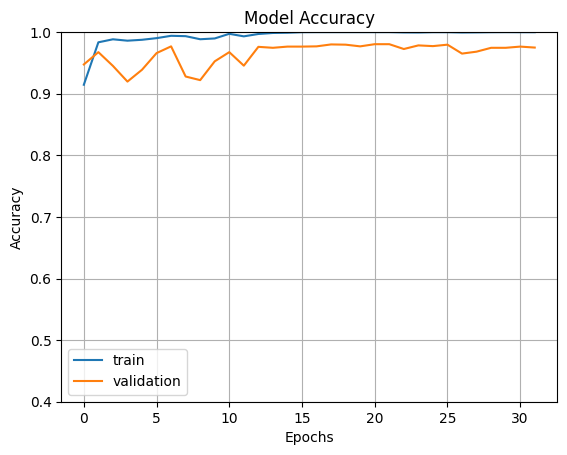

In [13]:
fig1 = plt.gcf()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.axis(ymin=0.4,ymax=1)
plt.grid()
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

### Metrics: Training vs Validation loss

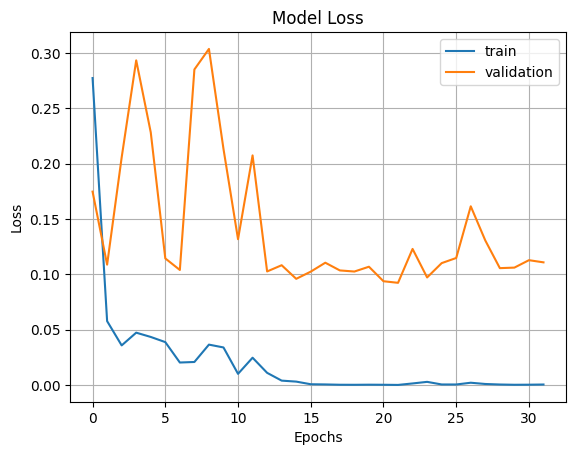

In [15]:
fig1 = plt.gcf()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

Metrics: Confusion Matrix

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

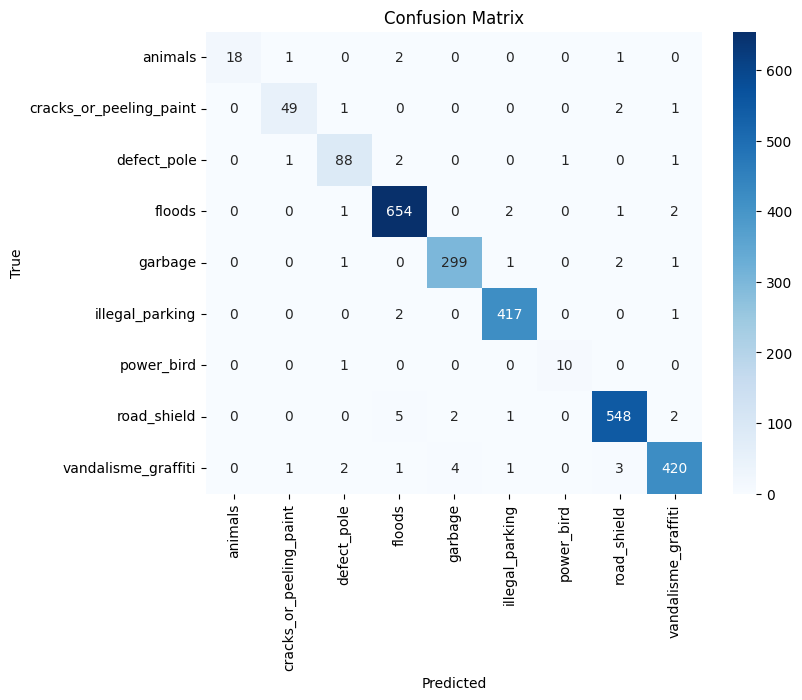

                         precision    recall  f1-score   support

                animals       1.00      0.82      0.90        22
cracks_or_peeling_paint       0.94      0.92      0.93        53
            defect_pole       0.94      0.95      0.94        93
                 floods       0.98      0.99      0.99       660
                garbage       0.98      0.98      0.98       304
        illegal_parking       0.99      0.99      0.99       420
             power_bird       0.91      0.91      0.91        11
            road_shield       0.98      0.98      0.98       558
    vandalisme_graffiti       0.98      0.97      0.98       432

               accuracy                           0.98      2553
              macro avg       0.97      0.95      0.96      2553
           weighted avg       0.98      0.98      0.98      2553



In [16]:
y_true = []
y_pred = []

for images, labels in val_ds:
 preds = resnet_model.predict(images)
 y_true.extend(np.argmax(labels.numpy(), axis=1))
 y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

print(classification_report(y_true, y_pred, target_names=class_names))

### Save the model and history of training

In [ ]:
resnet_model.save("my_resnet_model.keras")
with open("history_resnet.pkl", "wb") as f:
 pickle.dump(history.history, f)

### Plot predicions for one batch from validation set

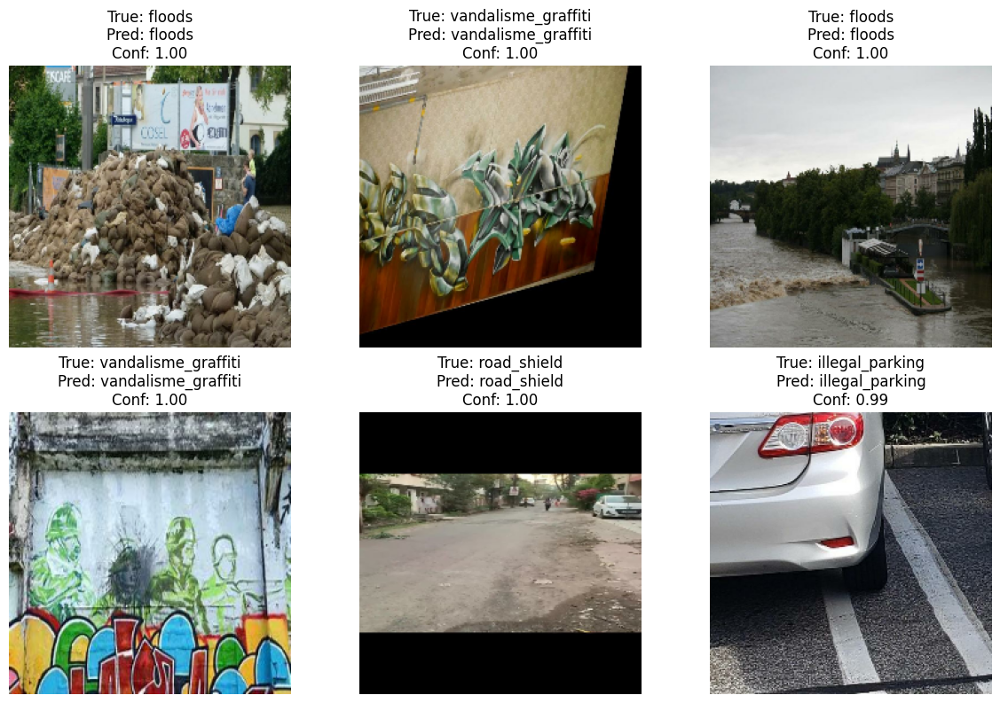

In [82]:
for images, labels in val_ds.take(1):
    num_images = 6
    cols = 3
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(cols * 4, rows * 4))
    for i in range(num_images):
        img = images[i]
        label = labels[i]

        #predict
        prediction = resnet_model.predict(tf.expand_dims(img, axis=0), verbose=0)
        predicted_idx = np.argmax(prediction[0])
        true_idx = np.argmax(label)  #using np.argmax because label is one-hot encoded
        confidence = prediction[0][predicted_idx]

        #display
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img.numpy().astype("uint8"))
        plt.title(
            f"True: {class_names[true_idx]}\nPred: {class_names[predicted_idx]}\nConf: {confidence:.2f}"
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### Test one image from test photos

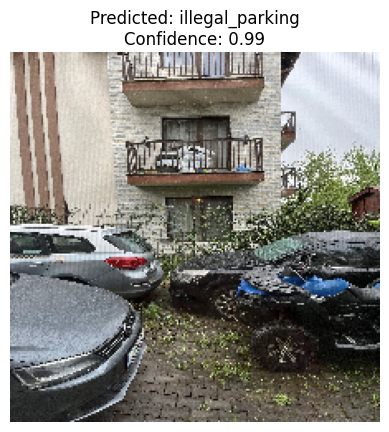

In [62]:
def predict_image(image_path, model, class_names, img_size=(224, 224)):
    #load and preprocess image
    img = tf.keras.utils.load_img(image_path, target_size=img_size)
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, axis=0)

    #predict
    predictions = model.predict(img_array, verbose=0)
    predicted_idx = np.argmax(predictions[0])
    confidence = predictions[0][predicted_idx]

    return img, predicted_idx, confidence

image_path = "/content/drive/MyDrive/Test photos/IMG_5413.HEIC"
img, predicted_idx, confidence = predict_image(image_path, resnet_model, class_names)
#display the image with prediction
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_idx]}\nConfidence: {confidence:.2f}")
plt.axis("off")
plt.show()

### Predict a folder of images (test photos)

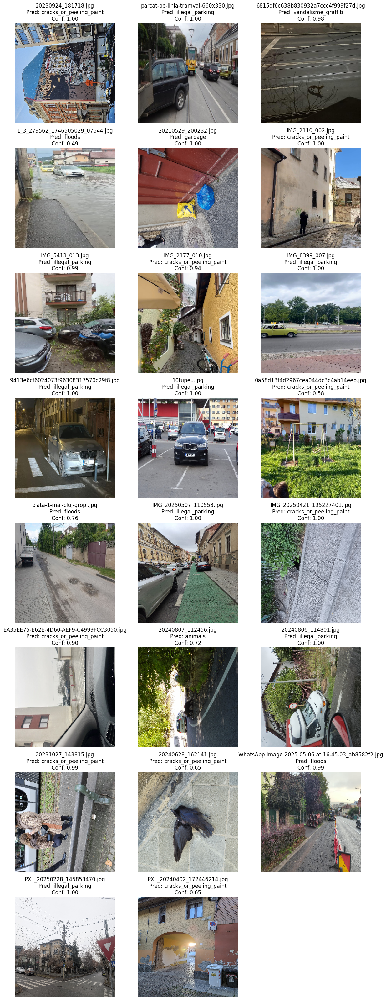

In [83]:
def predict_images_in_folder(folder_path, model, class_names, img_size=(224, 224), show=True):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    images = []
    titles = []

    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        img, predicted_idx, confidence = predict_image(image_path, resnet_model, class_names)

        #store for later display
        images.append(img)
        titles.append(f"{image_file}\nPred: {class_names[predicted_idx]}\nConf: {confidence:.2f}")

    #plot all images
    if show:
        cols = 3
        rows = (len(images) + cols - 1) // cols
        plt.figure(figsize=(cols * 4, rows * 4))

        for i, (img, title) in enumerate(zip(images, titles)):
            plt.subplot(rows, cols, i + 1)
            plt.imshow(img)
            plt.title(title)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

folder_path = "/content/drive/MyDrive/Test photos"
predict_images_in_folder(folder_path, resnet_model, class_names)

### Debugging.. see the missclassified images from the validation set

In [65]:
misclassified_images = []
misclassified_preds = []
misclassified_true = []
misclassified_confidences = []

for images, labels in val_ds:
  preds = resnet_model.predict(images)
  pred_classes = np.argmax(preds, axis=1)
  true_classes = np.argmax(labels.numpy(), axis=1)

  confidences = np.max(preds, axis=1)

  for i in range(len(images)):
    if pred_classes[i] != true_classes[i]:
      misclassified_images.append(images[i].numpy().astype("uint8"))
      misclassified_preds.append(pred_classes[i])
      misclassified_true.append(true_classes[i])
      misclassified_confidences.append(confidences[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

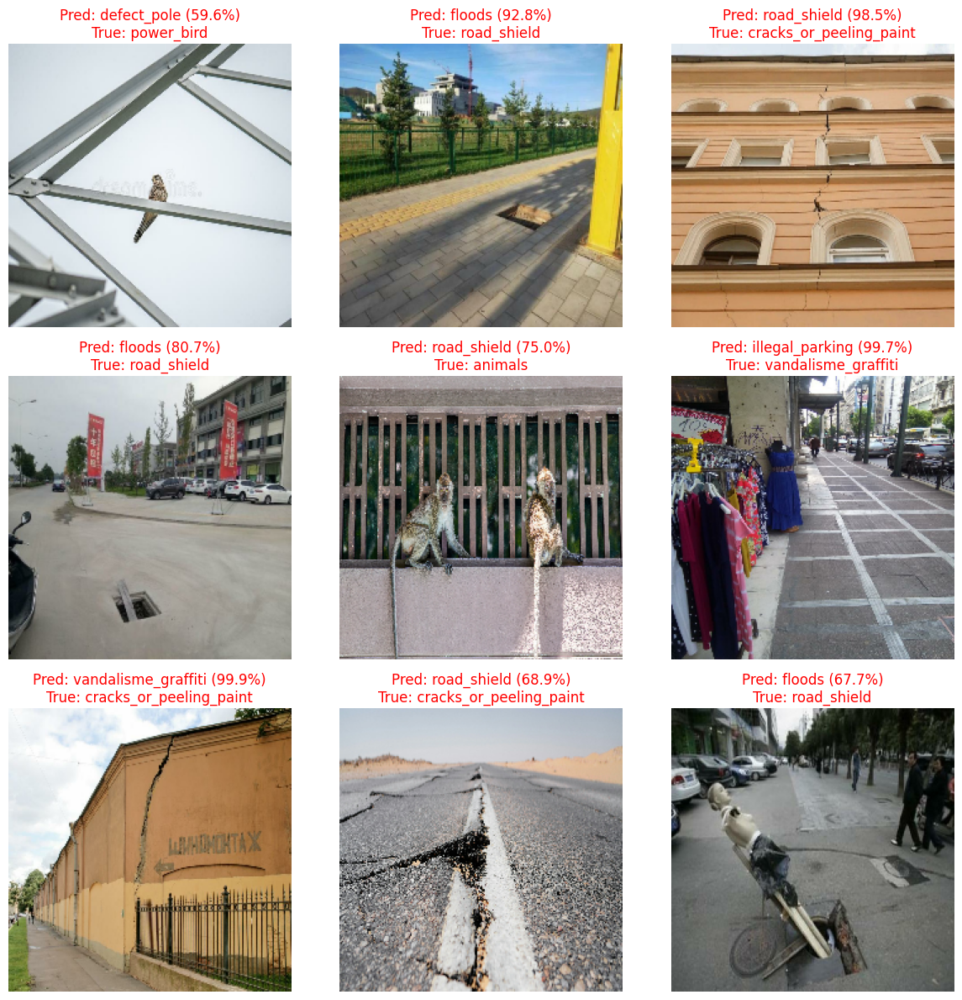

In [84]:
def show_misclassified_images(images, preds, true_labels, confidences, class_names, num=9):
    cols = 3
    rows = (num + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i in range(min(num, len(images))):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i])

        pred_label = class_names[preds[i]]
        true_label = class_names[true_labels[i]]
        confidence = confidences[i] * 100

        plt.title(f"Pred: {pred_label} ({confidence:.1f}%)\nTrue: {true_label}", color='red')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

#show top 9 misclassified images
show_misclassified_images(misclassified_images, misclassified_preds, misclassified_true, misclassified_confidences, class_names)

### Heatmap for predictions

In [71]:
#define Grad-CAM heatmap function
def get_gradcam_heatmap_sequential(base_model, classifier_model, image, class_index, last_conv_layer_name):
    #create a model that maps the input image to the activations of the last conv layer
    grad_model = tf.keras.models.Model(
        inputs=base_model.input,
        outputs=[base_model.get_layer(last_conv_layer_name).output, base_model.output]
    )

    #compute the gradient of the class score with respect to the output feature map
    with tf.GradientTape() as tape:
        conv_outputs, features = grad_model(tf.expand_dims(image, axis=0))
        predictions = classifier_model(features)
        loss = predictions[:, class_index]

    #compute the gradients of the loss w.r.t. the convolutional layer output
    grads = tape.gradient(loss, conv_outputs)[0]  #shape: (H, W, C)
    conv_outputs = conv_outputs[0]                #shape: (H, W, C)

    #compute the channel-wise mean of the gradients (importance of each channel)
    weights = tf.reduce_mean(grads, axis=(0, 1))  # Shape: (C,)

    #compute the weighted sum of the conv outputs
    cam = tf.reduce_sum(tf.multiply(conv_outputs, weights), axis=-1)

    #apply ReLU and normalize
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)

    #resize to original image size
    cam = cv2.resize(cam, (image.shape[1], image.shape[0]))

    return cam

def overlay_heatmap(image, heatmap, alpha=0.4, cmap='jet'):
 heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
 image_rgb = image.astype('uint8') # ← fixed line
 superimposed_img = cv2.addWeighted(image_rgb, 1 - alpha, heatmap_color, alpha, 0)
 return superimposed_img

### See the heatmap for one missclassified image

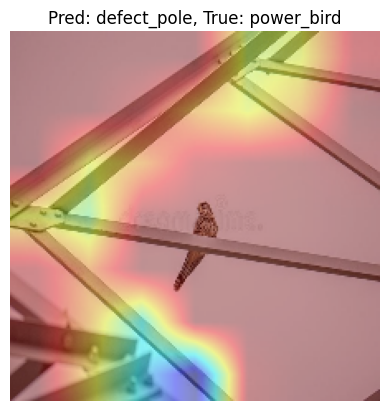

In [73]:
img = misclassified_images[0]
true_label = misclassified_true[0]
pred_label = misclassified_preds[0]

#split model
base_model = resnet_model.layers[0] #ResNet part
classifier_head = tf.keras.Sequential(resnet_model.layers[1:]) #Dense(9, softmax)

#get heatmap
heatmap = get_gradcam_heatmap_sequential(base_model, classifier_head, img, pred_label, "conv5_block3_out")

#overlay and show
superimposed = overlay_heatmap(img, heatmap)

plt.imshow(superimposed)
plt.title(f"Pred: {class_names[pred_label]}, True: {class_names[true_label]}")
plt.axis('off')
plt.show()

### See the heatmap for a folder of images (test photos)

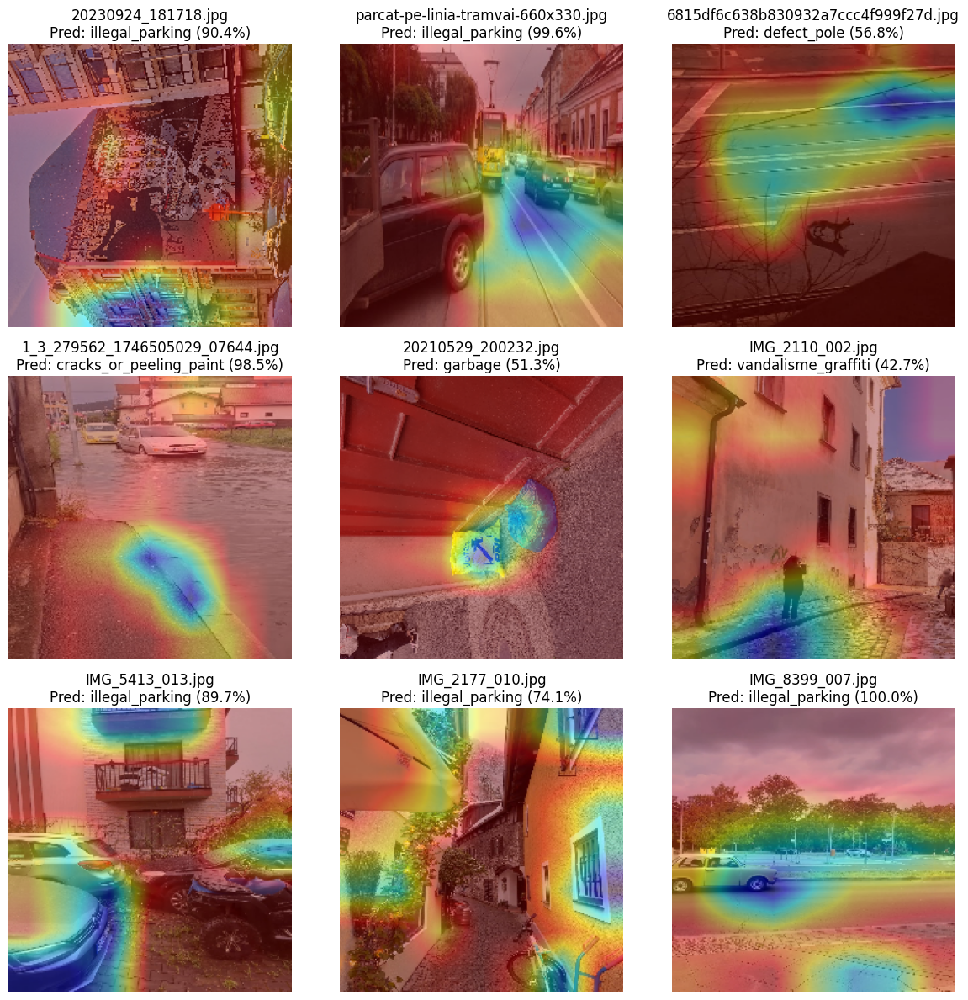

In [85]:
#apply Grad-CAM to each image in folder
def apply_gradcam_to_folder(folder_path, model, class_names, last_conv_layer_name, img_size=(224, 224), num_images=9):
    base_model = model.layers[0]
    classifier_head = tf.keras.Sequential(model.layers[1:])

    images = []
    titles = []

    for fname in os.listdir(folder_path):
        if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(folder_path, fname)

            #load and preprocess image
            img_raw = tf.keras.utils.load_img(image_path, target_size=img_size)
            img_array = tf.keras.utils.img_to_array(img_raw)
            img_preprocessed = tf.keras.applications.resnet50.preprocess_input(img_array.copy())

            #predict
            preds = model.predict(np.expand_dims(img_preprocessed, axis=0), verbose=0)
            pred_label = np.argmax(preds[0])
            confidence = preds[0][pred_label]

            #Grad-CAM heatmap
            heatmap = get_gradcam_heatmap_sequential(base_model, classifier_head, img_preprocessed, pred_label, last_conv_layer_name)
            superimposed = overlay_heatmap(img_array, heatmap)

            #store for later display
            images.append(superimposed)
            titles.append(f"{fname}\nPred: {class_names[pred_label]} ({confidence:.1%})")

        if len(images) >= num_images:
            break

    #plot all images in a grid
    cols = 3
    rows = (len(images) + cols - 1) // cols

    plt.figure(figsize=(cols * 4, rows * 4))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

folder_path = "/content/drive/MyDrive/Test photos"
apply_gradcam_to_folder(folder_path, resnet_model, class_names, last_conv_layer_name="conv5_block3_out")